# Exercise: Transfer Learning

When working in machine learning, you often encounter the problem of having built a few models by hand so far. However, their performance or generalization has been poor. And you might be wondering, **is there a well-performing model already existing for our problem?** And in deep learning, the answer is often *yes*.

We'll see how using a powerful technique called [**transfer learning**](https://developers.google.com/machine-learning/glossary#transfer-learning).


## What is transfer learning?

**Transfer learning** allows us to take the patterns (also called weights) another model has learned from another problem and use them for our problem. For example, we can take the patterns a computer vision model has learned from datasets such as [ImageNet](https://www.image-net.org/) (millions of images of different objects) and use them to power our model for a different task.

Or we could take the patterns from a [language model](https://developers.google.com/machine-learning/glossary#masked-language-model) (a model that's been through large amounts of text to learn a representation of language) and use them as the basis of a model to classify different text samples.

The premise remains: find a well-performing existing model and apply it to your problem.


## Why use transfer learning?

There are two main benefits to using transfer learning:

1. We can leverage an existing model (usually a neural network architecture) that has proven to work on similar problems.
2. Can leverage a working model with **already learned** patterns on similar data to ours, often resulting in **better results with less custom data**.

Both research and practice support the use of transfer learning too.

A finding from a recent machine learning research paper recommended practitioners use transfer learning wherever possible.

<img src="https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/images/06-how-to-train-your-vit-section-6-transfer-learning-highlight.png" width=900 alt="how to train your vision transformer paper section 6, advising to use transfer learning if you can"/>

*A study into whether training from scratch or using transfer learning was better from a practitioner's point of view found transfer learning to be far more beneficial in terms of cost and time. **Source:** [How to train your ViT? Data, Augmentation, and Regularization in Vision Transformers](https://arxiv.org/abs/2106.10270)*


## Where to find pretrained models?

You can find pretrained models to use for your problems in several places.
And often, code and pretrained models for even the latest state-of-the-art research are released within a few days of publishing.

| **Location** | **What's there?** | **Link(s)** |
| ----- | ----- | ----- |
| **PyTorch domain libraries** | Each of the PyTorch domain libraries (`torchvision`, `torchtext`) come with pretrained models of some form. The models there work right within PyTorch. | [`torchvision.models`](https://pytorch.org/vision/stable/models.html), [`torchtext.models`](https://pytorch.org/text/main/models.html), [`torchaudio.models`](https://pytorch.org/audio/stable/models.html), [`torchrec.models`](https://pytorch.org/torchrec/torchrec.models.html) |
| **HuggingFace Hub** | A series of pretrained models on many domains (vision, text, audio, and more) from organizations worldwide. There are also plenty of different datasets available. | https://huggingface.co/models, https://huggingface.co/datasets |
| **`timm` (PyTorch Image Models) library** | Almost all of the latest and greatest computer vision models in PyTorch code and many other helpful computer vision features. | https://github.com/rwightman/pytorch-image-models|
| **Paperswithcode** | A collection of the latest state-of-the-art machine learning papers with code implementations attached. You can also find benchmarks here of model performance on different tasks. | https://paperswithcode.com/ |

## 0. Getting setup

Let's get started by importing/downloading the required modules for this section.

> **Note:** As of June 2022, this notebook uses the nightly versions of `torch` and `torchvision` as `torchvision` v0.13+ is required for using the updated multi-weights API. You can install these using the command below.

In [1]:
# For this notebook to run with updated APIs, we need torch 1.12+ and torchvision 0.13+
try:
    import torch
    import torchvision
    import torchmetrics

    assert int(torch.__version__.split(".")[1]) >= 12, "torch version should be 1.12+"
    assert (
        int(torchvision.__version__.split(".")[1]) >= 13
    ), "torchvision version should be 0.13+"
    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")
except:
    print(
        f"[INFO] torch/torchvision versions not as required, installing nightly versions."
    )
    !pip3 install -U torch torchvision torchaudio torchmetrics --extra-index-url https://download.pytorch.org/whl/cu113
    import torch
    import torchvision

    print(f"torch version: {torch.__version__}")
    print(f"torchvision version: {torchvision.__version__}")

[INFO] torch/torchvision versions not as required, installing nightly versions.
Looking in indexes: https://pypi.org/simple, https://download.pytorch.org/whl/cu113
torch version: 2.5.1+cu121
torchvision version: 0.20.1+cu121


In [2]:
# Continue with regular imports
import matplotlib.pyplot as plt
import torch
import torchvision
import numpy as np

from tqdm.auto import tqdm
from typing import Dict, List, Tuple
from torch import nn
from torchvision import transforms

import torch.utils.data as data

# Try to get torchinfo, install it if it doesn't work
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Set the manual seeds
torch.manual_seed(42)
torch.cuda.manual_seed(42)

Now let's setup device agnostic code.

> **Note:** If you're using Google Colab, and you don't have a GPU turned on yet, it's now time to turn one on via `Runtime -> Change runtime type -> Hardware accelerator -> GPU`.

In [3]:
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

## 1. Get Data, create Datasets and DataLoaders

Before we can start to use **transfer learning**, we'll need a dataset.

Here we'll use DermaMNIST from MedMNIST, which features imaging data from Dermatology obtained through a Dermatoscope and is a multi-class setting.
The dataset features 10,015 number of samples with splits 7,007/1,003/2,005 for training/validation/testing.

All datasets from MedMNIST can be downloaded and used with their provided package `medmnist`.

In [4]:
try:
    from medmnist import DermaMNIST
except:
    print("[INFO] Couldn't find medmnist... installing it.")
    !pip install -q medmnist
    from medmnist import DermaMNIST

Using downloaded and verified file: /root/.medmnist/dermamnist_224.npz
Using downloaded and verified file: /root/.medmnist/dermamnist_224.npz


Dataset DermaMNIST of size 224 (dermamnist_224)
    Number of datapoints: 7007
    Root location: /root/.medmnist
    Split: train
    Task: multi-class
    Number of channels: 3
    Meaning of labels: {'0': 'actinic keratoses and intraepithelial carcinoma', '1': 'basal cell carcinoma', '2': 'benign keratosis-like lesions', '3': 'dermatofibroma', '4': 'melanoma', '5': 'melanocytic nevi', '6': 'vascular lesions'}
    Number of samples: {'train': 7007, 'val': 1003, 'test': 2005}
    Description: The DermaMNIST is based on the HAM10000, a large collection of multi-source dermatoscopic images of common pigmented skin lesions. The dataset consists of 10,015 dermatoscopic images categorized as 7 different diseases, formulized as a multi-class classification task. We split the images into training, validation and test set with a ratio of 7:1:2. The source images of 3×600×450 are resized into 3×28×28.
    License: CC BY-NC 4.0

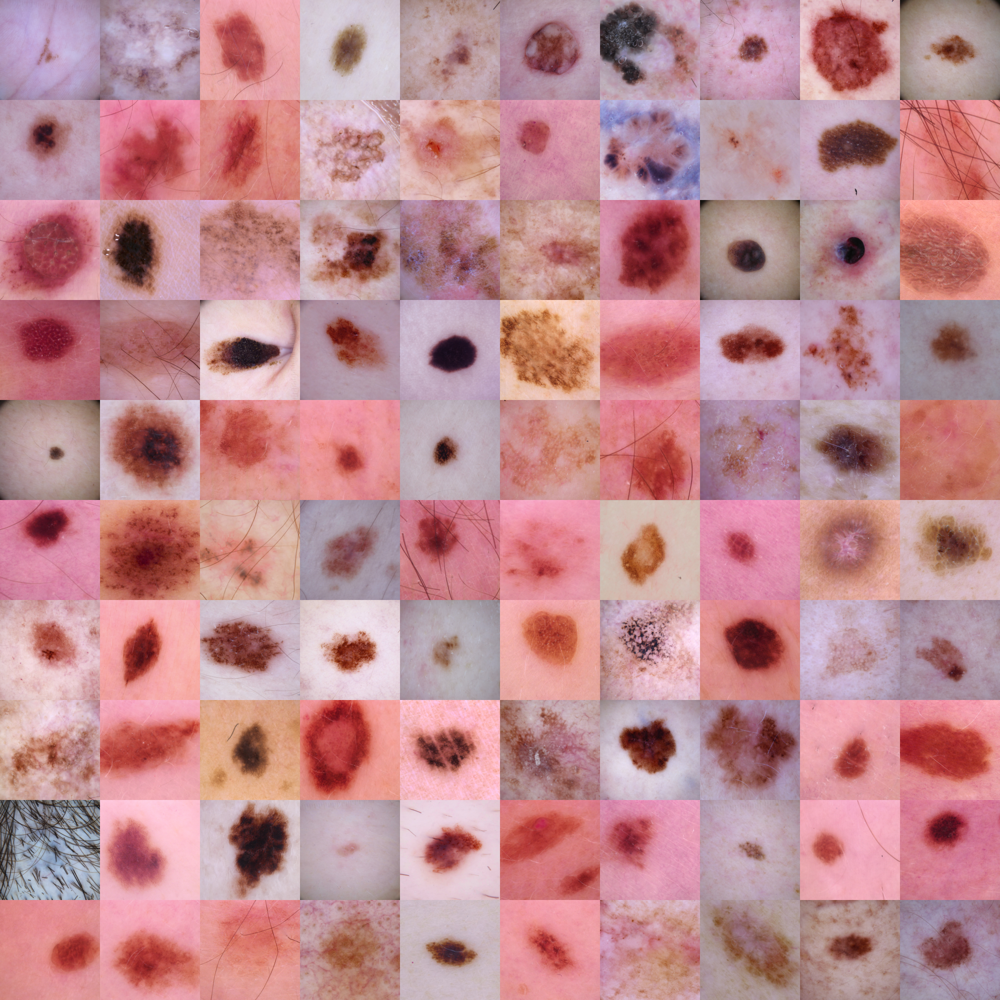

In [5]:
# NOTE: this might take some time, depending on your internet connection
train_dataset = DermaMNIST(split="train", download=True, size=224)
test_dataset = DermaMNIST(split="test", download=True, size=224)

display(train_dataset)

train_dataset.montage(10)

MedMNIST already creates PyTorch compatible datasets for us. However, we still need to set the respective `transform` to preprocess the images. And since we'll be using a pretrained model from [`torchvision.models`](https://pytorch.org/vision/stable/models.html), there's a specific transform we need to prepare our images first.

### 1.1 Creating a transform for `torchvision.models` (manual creation)

> **Note:** As of `torchvision` v0.13+, there's an update to how data transforms can be created using `torchvision.models`. Here, the previous method is "manual creation," and the new method is "auto creation." This notebook showcases both.

When using a pretrained model, it's important that **your custom data going into the model is prepared in the same way as the original training data that went into the model**.

Before `torchvision` v0.13+, to create a transform for a pretrained model in `torchvision.models`, the documentation stated:

> All pre-trained models expect input images normalized in the same way, i.e. mini-batches of 3-channel RGB images of shape (3 x H x W), where H and W are expected to be at least 224.
>
> The images have to be loaded in to a range of `[0, 1]` and then normalized using `mean = [0.485, 0.456, 0.406]` and `std = [0.229, 0.224, 0.225]`.
>
> You can use the following transform to normalize:
>
> ```
> normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
> ```

The good news is, that we can achieve the above transformations with a combination of:

| **Transform number** | **Transform required** | **Code to perform transform** |
| ----- | ----- | ----- |
| 1 | Mini-batches of size `[batch_size, 3, height, width]` where height and width are at least 224x224. | `torchvision.transforms.Resize()` to resize images into `[3, 224, 224]` and `torch.utils.data.DataLoader()` to create batches of images. |
| 2 | Values between 0 & 1. | `torchvision.transforms.ToTensor()` |
| 3 | A mean of `[0.485, 0.456, 0.406]` (values across each colour channel). | `torchvision.transforms.Normalize(mean=...)` to adjust the mean of our images.  |
| 4 | A standard deviation of `[0.229, 0.224, 0.225]` (values across each colour channel). | `torchvision.transforms.Normalize(std=...)` to adjust the standard deviation of our images.  |

Let's compose a series of `torchvision.transforms` to perform the above steps.

In [6]:
manual_transforms = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225],
        ),
    ]
)

manual_transforms

Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)

### 1.2 Creating a transform for `torchvision.models` (auto creation)

As previously stated, when using a pretrained model, it's important that **your custom data going into the model is prepared in the same way as the original training data that went into the model**. Above, we saw how to manually create a transform for a pretrained model. But as of `torchvision` v0.13+, an automatic transform creation feature has been added.

When you use a model from `torchvision.models` and select the pretrained model weights you'd like to use, for example, say we'd like to use:
    
```python
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
```

Where,
* `EfficientNet_B0_Weights` is the model architecture weights we'd like to use (there are many different model architecture options in `torchvision.models`).
* `DEFAULT` means the *best available* weights (the best performance in ImageNet).

In [7]:
# Get a set of pretrained model weights
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
weights

EfficientNet_B0_Weights.IMAGENET1K_V1

Now, we can use the `transforms()` method to access the transforms associated with our `weights`.

This essentially says, "get the data transforms that were used to train the `EfficientNet_B0_Weights` on ImageNet".

In [8]:
# Get the transforms used to create our pretrained weights
auto_transforms = weights.transforms()
auto_transforms

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BICUBIC
)

Notice how `auto_transforms` is very similar to `manual_transforms`. The only difference is that `auto_transforms` came with our chosen model architecture, whereas we had to create `manual_transforms` by hand. The benefit of automatically creating a transform through `weights.transforms()` is ensuring you're using the same data transformation as the pretrained model used when it was trained.

### 1.3 Setting `transform` and creating loaders

Now that we've got a **series of transforms** ready to prepare our images, let's create DataLoaders for training and testing. We'll set `batch_size=32` so our model sees mini-batches of 32 samples at a time. This works the same for `manual_transforms` and `auto_transforms`.

In [9]:
train_dataset.transform = auto_transforms
test_dataset.transform = auto_transforms

BATCH_SIZE = 32

train_dataloader = data.DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
)
test_dataloader = data.DataLoader(
    dataset=test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
)

class_names = list(train_dataset.info["label"].values())

train_dataloader, test_dataloader, class_names

(<torch.utils.data.dataloader.DataLoader at 0x7d208efbd840>,
 ['actinic keratoses and intraepithelial carcinoma',
  'basal cell carcinoma',
  'benign keratosis-like lesions',
  'dermatofibroma',
  'melanoma',
  'melanocytic nevi',
  'vascular lesions'])

## 2. Getting a pretrained model

The idea of transfer learning is to **take an already well-performing model on a similar problem and then customize it to your use case**. Since we're working on a computer vision problem (image classification with FoodVision Mini), we can find pretrained classification models in [`torchvision.models`](https://pytorch.org/vision/stable/models.html#classification).

Exploring the documentation, you'll find plenty of common computer vision architecture backbones such as:

| **Architecture backbone** | **Code** |
| ----- | ----- |
| [ResNet](https://arxiv.org/abs/1512.03385)'s | `torchvision.models.resnet18()`, `torchvision.models.resnet50()`... |
| [VGG](https://arxiv.org/abs/1409.1556) (similar to what we used for TinyVGG) | `torchvision.models.vgg16()` |
| [EfficientNet](https://arxiv.org/abs/1905.11946)'s | `torchvision.models.efficientnet_b0()`, `torchvision.models.efficientnet_b1()`... |
| [VisionTransformer](https://arxiv.org/abs/2010.11929) (ViT's)| `torchvision.models.vit_b_16()`, `torchvision.models.vit_b_32()`... |
| [ConvNeXt](https://arxiv.org/abs/2201.03545) | `torchvision.models.convnext_tiny()`,  `torchvision.models.convnext_small()`... |
| More available in `torchvision.models` | `torchvision.models...` |

### 2.1 Which pretrained model should you use?

It depends on your problem/the device you're working with.

Generally, the higher number in the model name (e.g., `efficientnet_b0()`-> `efficientnet_b7()`) means *better performance* but a *larger* model. You might think better performance is *always better*. That's often true, but **some better-performing models are too big for some devices**. For example, say you'd like to run your model on a mobile device. You'll have to consider the limited computing resources on the device. Thus, you'd be looking for a smaller model. Typically, the `efficientnet_bX` models find a nice balance between performance vs. speed vs. size.

> **Note:** Even though we're using `efficientnet_bX`, it's important not to get too attached to any one architecture, as they are always changing as new research gets released. It is best to experiment and see what works for your problem.

### 2.2 Setting up a pretrained model

The pretrained model we're going to be using is [`torchvision.models.efficientnet_b0()`](https://pytorch.org/vision/main/models/generated/torchvision.models.efficientnet_b0.html), introduced in *[EfficientNet: Rethinking Model Scaling for Convolutional Neural Networks](https://arxiv.org/abs/1905.11946)*.

We can setup the `EfficientNet_B0` pretrained ImageNet weights using the same code as we used to create the transforms.


```python
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
```

This means the model has already been trained on millions of images and has a good base representation of image data.

In [10]:
# Setup the model with pretrained weights and send it to the target device (torchvision v0.13+)
weights = torchvision.models.EfficientNet_B0_Weights.DEFAULT
model = torchvision.models.efficientnet_b0(weights=weights).to(device)

> **Note:** In previous versions of `torchvision`, you'd create a pretrained model with code like:
>
> `model = torchvision.models.efficientnet_b0(pretrained=True).to(device)`
>
> However, running this using `torchvision` v0.13+ will result in errors such as the following:
>
> `UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.`
>
> And...
>
> `UserWarning: Arguments other than a weight enum or None for weights are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing weights=EfficientNet_B0_Weights.IMAGENET1K_V1. You can also use weights=EfficientNet_B0_Weights.DEFAULT to get the most up-to-date weights.`

In [11]:
# print the model architecture
model

EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActivat

Our `efficientnet_b0` comes in three main parts:
1. `features` - A collection of convolutional layers and other various activation layers to learn a base representation of vision data (this base representation/collection of layers is often referred to as **features** or **feature extractor**, "the base layers of the model learn the different **features** of images").
2. `avgpool` - Takes the average of the output of the `features` layer(s) and turns it into a **feature vector**.
3. `classifier` - Turns the **feature vector** into a vector with the same dimensionality as the number of required output classes (since `efficientnet_b0` is pretrained on ImageNet and because ImageNet has 1000 classes, `out_features=1000` is the default).

### 2.3 Getting a summary of our model with `torchinfo.summary()`

To learn more about our model, let's use `torchinfo`'s [`summary()` method](https://github.com/TylerYep/torchinfo#documentation).

To do so, we'll pass in:
 * `model` - the model we'd like to get a summary of.
 * `input_size` - the shape of the data we'd like to pass to our model, for the case of `efficientnet_b0`, the input size is `(batch_size, 3, 224, 224)`, though [other variants of `efficientnet_bX` have different input sizes](https://github.com/pytorch/vision/blob/d2bfd639e46e1c5dc3c177f889dc7750c8d137c7/references/classification/train.py#L92-L93).
 * `col_names` - the various information columns we'd like to see about our model.
 * `col_width` - how wide the columns should be for the summary.
 * `row_settings` - what features to show in a row.

In [12]:
# Print a summary using torchinfo (uncomment for actual output)
summary(
    model=model,
    input_size=(32, 3, 224, 224),  # make sure this is "input_size", not "input_shape"
    # col_names=["input_size"], # uncomment for smaller output
    col_names=["output_size", "num_params", "trainable"],
    col_width=20,
    row_settings=["var_names"],
)

Layer (type (var_name))                                      Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 1000]           --                   True
├─Sequential (features)                                      [32, 1280, 7, 7]     --                   True
│    └─Conv2dNormActivation (0)                              [32, 32, 112, 112]   --                   True
│    │    └─Conv2d (0)                                       [32, 32, 112, 112]   864                  True
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   64                   True
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 16, 112, 112]   --                   True
│    │    └─MBConv (0)                                       [32, 16, 112, 112]   1,448                True
│    └─Sequential (2)    

### 2.4 Freezing the base model and changing the output layer to suit our needs

The transfer learning process usually goes as follows: freeze some base layers of a pretrained model (typically the `features` section) and then adjust the output layers (also called head/classifier layers) to suit your needs.

Let's freeze all of the layers/parameters in the `features` section of our `efficientnet_b0` model.

> **Note:** To *freeze* layers means keeping them as they are during training. For example, if your model has pretrained layers, to *freeze* them would be to say, "don't change any of the patterns in these layers during training. Keep them how they are." We want to keep the pretrained weights/patterns our model has learned from ImageNet as a backbone and then only change the output layers.

We can freeze all layers/parameters in the `features` section by setting the attribute `requires_grad=False`. For parameters with `requires_grad=False`, PyTorch doesn't track gradient updates. In turn, our optimizer won't change these parameters during training. Essentially, a parameter with `requires_grad=False` is "untrainable" or "frozen" in place.

In [13]:
for param in model.features.parameters():
    param.requires_grad = False

The feature extractor layers are now frozen. Now, adjust the output layer or the `classifier` portion of our pretrained model to fit our needs. Our pretrained model currently has `out_features=1000` because there are 1000 classes in ImageNet. However, we don't have 1000 classes. We only have seven classes. We can change our model's `classifier` portion by creating a new series of layers.

The current `classifier` consists of:

```
(classifier): Sequential(
    (0): Dropout(p=0.2, inplace=True)
    (1): Linear(in_features=1280, out_features=1000, bias=True)
```

We'll keep the `Dropout` layer the same. And we'll keep `in_features=1280` for our `Linear` output layer, but we'll change the `out_features` value to the length of our `class_names`.

In [14]:
# Get the length of class_names (one output unit for each class)
output_shape = len(class_names)

# Recreate the classifier layer and seed it to the target device
model.classifier = torch.nn.Sequential(
    torch.nn.Dropout(p=0.2, inplace=True),
    torch.nn.Linear(
        in_features=1280,
        out_features=output_shape,  # same number of output units as our number of classes
        bias=True,
    ),
).to(device)

The output layer has been updated. Let's get another summary of our model and see what's changed.

In [15]:
# # Do a summary *after* freezing the features and changing the output classifier layer (uncomment for actual output)
summary(
    model,
    # make sure this is "input_size", not "input_shape" (batch_size, color_channels, height, width)
    input_size=(32, 3, 224, 224),
    verbose=0,
    col_names=["output_size", "num_params", "trainable"],
    col_width=20,
    row_settings=["var_names"],
)

Layer (type (var_name))                                      Output Shape         Param #              Trainable
EfficientNet (EfficientNet)                                  [32, 7]              --                   Partial
├─Sequential (features)                                      [32, 1280, 7, 7]     --                   False
│    └─Conv2dNormActivation (0)                              [32, 32, 112, 112]   --                   False
│    │    └─Conv2d (0)                                       [32, 32, 112, 112]   (864)                False
│    │    └─BatchNorm2d (1)                                  [32, 32, 112, 112]   (64)                 False
│    │    └─SiLU (2)                                         [32, 32, 112, 112]   --                   --
│    └─Sequential (1)                                        [32, 16, 112, 112]   --                   False
│    │    └─MBConv (0)                                       [32, 16, 112, 112]   (1,448)              False
│    └─Sequentia

There are a few changes now. Let's go through them:
* **Trainable column** - You'll see that many of the base layers (the ones in the `features` portion) have their Trainable value as `False`. This is because we set their attribute `requires_grad=False`. Unless we change this, these layers won't be updated during future training.
* **Output shape of `classifier`** - The `classifier` portion of the model now has an Output Shape value of `[32, 7]` instead of `[32, 1000]`. Its Trainable value is also `True`. This means its parameters will be updated during training. In essence, we're using the `features` portion to feed our `classifier` portion a base representation of an image, and then our `classifier` layer will learn how the base representation aligns with our problem.
* **Less trainable parameters** - Previously there were 5,288,548 trainable parameters. But since we froze many of the model's layers and only left the `classifier` as trainable, there are now only 8,967 trainable parameters (even less than our TinyVGG model). Though there are also 4,007,548 non-trainable parameters, these will create a base representation of our input images to feed into our `classifier` layer.

> **Note:** The more trainable parameters a model has, the more compute power/longer it takes to train. Freezing the base layers of our model and leaving it with less trainable parameters means our model should train quite quickly. One huge benefit of transfer learning is taking the already learned parameters of a model trained on a problem similar to yours and only tweaking the outputs slightly to suit your problem.

## 3. Train model

Now we've got a pretrained model that's semi-frozen and has a customised `classifier`. To begin training, let's create a loss function and an optimizer. Because we're still working with multi-class classification, we'll use `nn.CrossEntropyLoss()` for the loss function. And we'll stick with `torch.optim.Adam()` as our optimizer with `lr=0.001`.

In [16]:
# Define loss and optimizer
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

To train our model, we can use `train()` function we defined below.

In [17]:
from torchmetrics import F1Score


def train_step(
    model: torch.nn.Module,
    dataloader: torch.utils.data.DataLoader,
    loss_fn: torch.nn.Module,
    optimizer: torch.optim.Optimizer,
    device: torch.device,
) -> Tuple[float, float]:
    """Trains a PyTorch model for a single epoch.

    Turns a target PyTorch model to training mode and then
    runs through all of the required training steps (forward
    pass, loss calculation, optimizer step).

    Args:
      model: A PyTorch model to be trained.
      dataloader: A DataLoader instance for the model to be trained on.
      loss_fn: A PyTorch loss function to minimize.
      optimizer: A PyTorch optimizer to help minimize the loss function.
      device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
      A tuple of training loss and training accuracy metrics.
      In the form (train_loss, train_accuracy).
    """
    # Put model in train mode
    model.train()

    # Setup train loss and train accuracy values
    f1 = F1Score(task="multiclass", num_classes=len(class_names), average="macro").to(
        device
    )
    train_loss, train_acc, train_f1 = 0, 0, 0

    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X, y = X.to(device), y.to(device)
        y = y.squeeze().long()

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metric across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item() / len(y_pred)
        train_f1 += f1(y_pred_class, y).item()

    # Adjust metrics to get average loss and accuracy per batch
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    train_f1 = train_f1 / len(dataloader)
    return train_loss, train_acc, train_f1


def test_step(
    model: torch.nn.Module,
    dataloader: torch.utils.data.DataLoader,
    loss_fn: torch.nn.Module,
    device: torch.device,
) -> Tuple[float, float]:
    """Tests a PyTorch model for a single epoch.

    Turns a target PyTorch model to "eval" mode and then performs
    a forward pass on a testing dataset.

    Args:
      model: A PyTorch model to be tested.
      dataloader: A DataLoader instance for the model to be tested on.
      loss_fn: A PyTorch loss function to calculate loss on the test data.
      device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
      A tuple of testing loss and testing accuracy metrics.
      In the form (test_loss, test_accuracy).
    """
    # Put model in eval mode
    model.eval()

    # Setup test loss and test accuracy values
    f1 = F1Score(task="multiclass", num_classes=len(class_names), average="macro").to(
        device
    )
    test_loss, test_acc, test_f1 = 0, 0, 0

    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # Send data to target device
            X, y = X.to(device), y.to(device)
            y = y.squeeze().long()

            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()

            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += (test_pred_labels == y).sum().item() / len(test_pred_labels)
            test_f1 += f1(test_pred_labels, y).item()

    # Adjust metrics to get average loss and accuracy per batch
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    test_f1 = test_f1 / len(dataloader)
    return test_loss, test_acc, test_f1


def train(
    model: torch.nn.Module,
    train_dataloader: torch.utils.data.DataLoader,
    test_dataloader: torch.utils.data.DataLoader,
    optimizer: torch.optim.Optimizer,
    loss_fn: torch.nn.Module,
    epochs: int,
    device: torch.device,
) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
      model: A PyTorch model to be trained and tested.
      train_dataloader: A DataLoader instance for the model to be trained on.
      test_dataloader: A DataLoader instance for the model to be tested on.
      optimizer: A PyTorch optimizer to help minimize the loss function.
      loss_fn: A PyTorch loss function to calculate loss on both datasets.
      epochs: An integer indicating how many epochs to train for.
      device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
      A dictionary of training and testing loss as well as training and
      testing accuracy metrics. Each metric has a value in a list for
      each epoch.
      In the form: {train_loss: [...],
                    train_acc: [...],
                    train_f1: [...],
                    test_loss: [...],
                    test_acc: [...],
                    test_f1: [...]}
    """
    # Create empty results dictionary
    results = {
        "train_loss": [],
        "train_acc": [],
        "train_f1": [],
        "test_loss": [],
        "test_acc": [],
        "test_f1": [],
    }

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc, train_f1 = train_step(
            model=model,
            dataloader=train_dataloader,
            loss_fn=loss_fn,
            optimizer=optimizer,
            device=device,
        )
        test_loss, test_acc, test_f1 = test_step(
            model=model,
            dataloader=test_dataloader,
            loss_fn=loss_fn,
            device=device,
        )

        # Print out what's happening
        print(
            f"Epoch: {epoch+1} | "
            f"train_loss: {train_loss:.4f} | "
            f"train_acc: {train_acc:.4f} | "
            f"train_f1: {train_f1:.4f} | "
            f"test_loss: {test_loss:.4f} | "
            f"test_acc: {test_acc:.4f} | "
            f"test_f1: {test_f1:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["train_f1"].append(train_f1)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)
        results["test_f1"].append(test_f1)

    # Return the filled results at the end of the epochs
    return results

Let's see how long it takes to train our model for 10 epochs.

> **Note:** We're only going to be training the parameters `classifier` here as all of the other parameters in our model have been frozen.

In [18]:
# Setup training and save the results
results = train(
    model=model,
    train_dataloader=train_dataloader,
    test_dataloader=test_dataloader,
    optimizer=optimizer,
    loss_fn=loss_fn,
    epochs=10,
    device=device,
)

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 0.9446 | train_acc: 0.6939 | train_f1: 0.3305 | test_loss: 0.7783 | test_acc: 0.7326 | test_f1: 0.4267
Epoch: 2 | train_loss: 0.7470 | train_acc: 0.7400 | train_f1: 0.4564 | test_loss: 0.7134 | test_acc: 0.7484 | test_f1: 0.4718
Epoch: 3 | train_loss: 0.6943 | train_acc: 0.7565 | train_f1: 0.4928 | test_loss: 0.6772 | test_acc: 0.7579 | test_f1: 0.5028
Epoch: 4 | train_loss: 0.6568 | train_acc: 0.7670 | train_f1: 0.5172 | test_loss: 0.6580 | test_acc: 0.7608 | test_f1: 0.5029
Epoch: 5 | train_loss: 0.6415 | train_acc: 0.7695 | train_f1: 0.5317 | test_loss: 0.6491 | test_acc: 0.7619 | test_f1: 0.5017
Epoch: 6 | train_loss: 0.6229 | train_acc: 0.7787 | train_f1: 0.5512 | test_loss: 0.6425 | test_acc: 0.7666 | test_f1: 0.5038
Epoch: 7 | train_loss: 0.6021 | train_acc: 0.7795 | train_f1: 0.5575 | test_loss: 0.6387 | test_acc: 0.7651 | test_f1: 0.5113
Epoch: 8 | train_loss: 0.5956 | train_acc: 0.7831 | train_f1: 0.5632 | test_loss: 0.6395 | test_acc: 0.7626 | test_f1:

## 4. Evaluate the model by plotting loss curves

Our model looks like it's performing pretty well. Let's plot its loss curves to see what the training looks like over time.

In [19]:
def plot_loss_curves(results: Dict[str, List[float]]):
    """Plots training curves of a results dictionary.

    Args:
        results (dict): dictionary containing list of values, e.g.
            {"train_loss": [...],
             "train_acc": [...],
             "train_f1": [...],
             "test_loss": [...],
             "test_acc": [...]
             "test_f1": [...]}
    """
    loss = results["train_loss"]
    test_loss = results["test_loss"]

    accuracy = results["train_acc"]
    test_accuracy = results["test_acc"]

    f1 = results["train_f1"]
    test_f1 = results["test_f1"]

    epochs = range(len(results["train_loss"]))

    plt.figure(figsize=(15, 7))

    plt.subplot(1, 3, 1)
    plt.plot(epochs, loss, label="train_loss")
    plt.plot(epochs, test_loss, label="test_loss")
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.legend()

    plt.subplot(1, 3, 2)
    plt.plot(epochs, accuracy, label="train_accuracy")
    plt.plot(epochs, test_accuracy, label="test_accuracy")
    plt.title("Accuracy")
    plt.xlabel("Epochs")
    plt.legend()

    plt.subplot(1, 3, 3)
    plt.plot(epochs, f1, label="train_f1")
    plt.plot(epochs, test_f1, label="test_f1")
    plt.title("F1")
    plt.xlabel("Epochs")
    plt.legend()

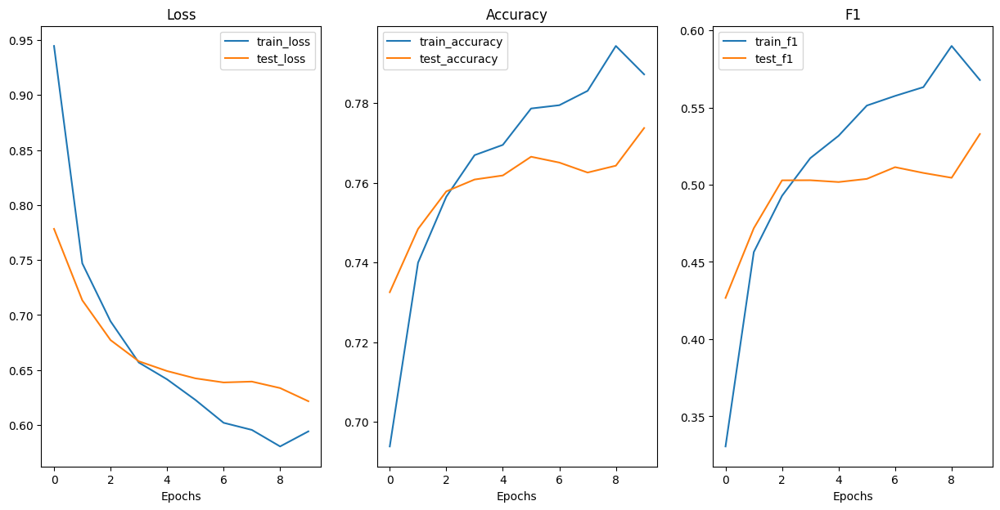

In [20]:
plot_loss_curves(results)

The loss for both datasets (train and test) is heading in the right direction. The same is true for the accuracy and F1 values, which are trending upwards. That goes to show the power of **transfer learning**. A pretrained model often yields good results with a small amount of data in less time.

What would happen if you tried to train the model for longer? Or if we added more data?

## 5. Make predictions on images from the test set

Our model performs well quantitatively, but how about qualitatively? Let's find out by making predictions with our model on images from the test set (these aren't seen during training) and plotting them.

We'll have to remember that for our model to make predictions on an image, the image has to be in *same* format as the images our model was trained on.

This means we'll need to make sure our images have:
* **Same shape** - If our images differ from what our model was trained on, we'll get shape errors.
* **Same datatype** - We'll get errors if our images are of a different datatype (e.g., `torch.int8` vs. `torch.float32`).
* **Same device** - If our images are on a different device to our model, we'll get device errors.
* **Same transformations** - If our model is trained on images transformed in a certain way (e.g., normalized with a specific mean and standard deviation), and we try to make predictions on images transformed differently, these predictions may be off.

In [21]:
from typing import List, Tuple

from PIL import Image

# 1. Take in a trained model, class names, image path, image size, a transform and target device
def pred_and_plot_image(
    model: torch.nn.Module,
    image: np.ndarray,
    image_transformed: torch.Tensor,
    true_label: int,
    class_names: List[str],
    transform: torchvision.transforms,
    image_size: Tuple[int, int] = (224, 224),
    device: torch.device = device,
):
    # 4. Make sure the model is on the target device
    model.to(device)
    # 5. Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
        # 6. Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
        transformed_image = image_transformed.unsqueeze(dim=0)
        # 7. Make a prediction on image with an extra dimension and send it to the target device
        target_image_pred = model(transformed_image.to(device))

    # 8. Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)
    # 9. Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)
    # 10. Plot image with predicted label and probability
    plt.figure()
    plt.imshow(image)
    plt.title(
        f"Pred: {class_names[target_image_pred_label]} (p={target_image_pred_probs.max():.2f})\n"
        f"True: {class_names[true_label]}"
    )
    plt.axis(False);

Let's test the function by making predictions on a few images from the test set.

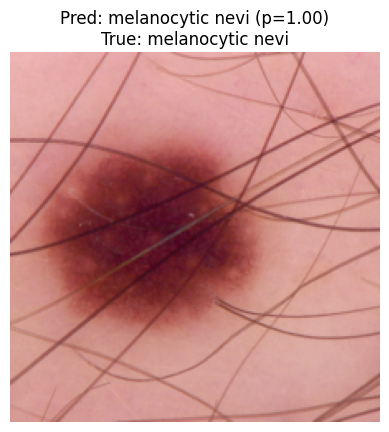

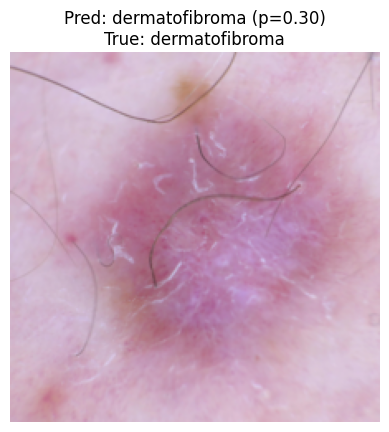

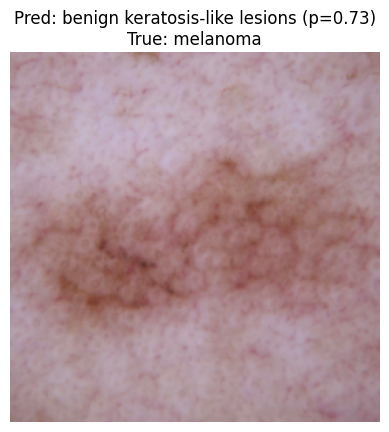

In [22]:
num_images_to_plot = 3
# Make predictions on and plot the images
for image_idx in range(num_images_to_plot):
    pred_and_plot_image(
        model=model,
        image=test_dataset.imgs[image_idx],
        image_transformed=test_dataset[image_idx][0],
        true_label=test_dataset[image_idx][-1].item(),
        class_names=class_names,
        transform=weights.transforms(),
        image_size=(224, 224),
    )

## 99. Main takeaways
* **Transfer learning** often allows you to get good results with a relatively small amount of custom data.
* Knowing the power of transfer learning, it's a good idea to ask at the start of every problem, "does an existing well-performing model exist for my problem?"
* When using a pretrained model, it's important that your custom data be formatted/preprocessed in the same way that the original model was trained. Otherwise, you may get degraded performance.
* The same goes for predicting custom data. Ensure your custom data is in the same format as the data your model was trained on.
* There are several different places to find pretrained models from the PyTorch domain libraries, HuggingFace Hub, and libraries such as `timm` (PyTorch Image Models).